In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")

AnnData object 5292 ✕ 1000

In [6]:
adata.uns["iroot"] = 0

0

In [7]:
normalize(adata)

AnnData object 5292 ✕ 1000

In [8]:
filter_and_gene_kinetics_predetermination(adata)

[ Info: 635 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 15 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 350 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 5292 ✕ 1000

In [9]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 5292, 350)


AnnData object 5292 ✕ 1000

In [10]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 350, leakyrelu),  # 105_000 parameters
  SpatialDense(100 => 100, depth = 350, leakyrelu),  # 3_535_000 parameters
  SpatialDense(100 => 3, depth = 350, σ),  # 106_050 parameters
)                   # Total: 6 arrays, 3_746_050 parameters, 14.290 MiB.

In [11]:
density_sampling(adata)

[ Info: Sample 2400 cells


AnnData object 5292 ✕ 1000

In [12]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/bone_marrow/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 30984.506f0, penalty = 1341.3772f0, AvgMeanCos = 0.9631f0)
Epoch: 1  Train: (cos_loss = 30645.152f0, penalty = 1341.2651f0, AvgMeanCos = 0.9635f0)
Epoch: 2  Train: (cos_loss = 30348.545f0, penalty = 1341.1527f0, AvgMeanCos = 0.9639f0)
Epoch: 3  Train: (cos_loss = 30074.836f0, penalty = 1341.0398f0, AvgMeanCos = 0.9642f0)
Epoch: 4  Train: (cos_loss = 29823.74f0, penalty = 1340.9265f0, AvgMeanCos = 0.9645f0)
Epoch: 5  Train: (cos_loss = 29594.992f0, penalty = 1340.8134f0, AvgMeanCos = 0.9648f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 29386.766f0, penalty = 1340.6995f0, AvgMeanCos = 0.965f0)
Epoch: 7  Train: (cos_loss = 29188.438f0, penalty = 1340.5857f0, AvgMeanCos = 0.9653f0)
Epoch: 8  Train: (cos_loss = 28991.83f0, penalty = 1340.4716f0, AvgMeanCos = 0.9655f0)
Epoch: 9  Train: (cos_loss = 28798.605f0, penalty = 1340.3574f0, AvgMeanCos = 0.9657f0)
Epoch: 10  Train: (cos_loss = 28605.324f0, penalty = 1340.2435f0, AvgMeanCos = 0.9659f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 28418.553f0, penalty = 1340.1296f0, AvgMeanCos = 0.9662f0)
Epoch: 12  Train: (cos_loss = 28238.826f0, penalty = 1340.0157f0, AvgMeanCos = 0.9664f0)
Epoch: 13  Train: (cos_loss = 28063.594f0, penalty = 1339.9017f0, AvgMeanCos = 0.9666f0)
Epoch: 14  Train: (cos_loss = 27899.465f0, penalty = 1339.7874f0, AvgMeanCos = 0.9668f0)
Epoch: 15  Train: (cos_loss = 27740.55f0, penalty = 1339.6726f0, AvgMeanCos = 0.967f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 27590.691f0, penalty = 1339.5579f0, AvgMeanCos = 0.9672f0)
Epoch: 17  Train: (cos_loss = 27447.299f0, penalty = 1339.4425f0, AvgMeanCos = 0.9673f0)
Epoch: 18  Train: (cos_loss = 27312.445f0, penalty = 1339.3269f0, AvgMeanCos = 0.9675f0)
Epoch: 19  Train: (cos_loss = 27187.174f0, penalty = 1339.2108f0, AvgMeanCos = 0.9676f0)
Epoch: 20  Train: (cos_loss = 27069.88f0, penalty = 1339.0942f0, AvgMeanCos = 0.9678f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 26960.623f0, penalty = 1338.977f0, AvgMeanCos = 0.9679f0)
Epoch: 22  Train: (cos_loss = 26858.377f0, penalty = 1338.8596f0, AvgMeanCos = 0.968f0)
Epoch: 23  Train: (cos_loss = 26764.13f0, penalty = 1338.7416f0, AvgMeanCos = 0.9681f0)
Epoch: 24  Train: (cos_loss = 26674.617f0, penalty = 1338.6227f0, AvgMeanCos = 0.9682f0)
Epoch: 25  Train: (cos_loss = 26592.771f0, penalty = 1338.5034f0, AvgMeanCos = 0.9683f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 26513.107f0, penalty = 1338.3838f0, AvgMeanCos = 0.9684f0)
Epoch: 27  Train: (cos_loss = 26437.154f0, penalty = 1338.2637f0, AvgMeanCos = 0.9685f0)
Epoch: 28  Train: (cos_loss = 26366.428f0, penalty = 1338.1426f0, AvgMeanCos = 0.9686f0)
Epoch: 29  Train: (cos_loss = 26299.258f0, penalty = 1338.0215f0, AvgMeanCos = 0.9687f0)
Epoch: 30  Train: (cos_loss = 26233.443f0, penalty = 1337.8998f0, AvgMeanCos = 0.9688f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 26170.488f0, penalty = 1337.7778f0, AvgMeanCos = 0.9688f0)
Epoch: 32  Train: (cos_loss = 26110.664f0, penalty = 1337.6552f0, AvgMeanCos = 0.9689f0)
Epoch: 33  Train: (cos_loss = 26049.629f0, penalty = 1337.5321f0, AvgMeanCos = 0.969f0)
Epoch: 34  Train: (cos_loss = 25994.188f0, penalty = 1337.4089f0, AvgMeanCos = 0.9691f0)
Epoch: 35  Train: (cos_loss = 25944.414f0, penalty = 1337.2852f0, AvgMeanCos = 0.9691f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 25897.33f0, penalty = 1337.161f0, AvgMeanCos = 0.9692f0)
Epoch: 37  Train: (cos_loss = 25847.95f0, penalty = 1337.0367f0, AvgMeanCos = 0.9692f0)
Epoch: 38  Train: (cos_loss = 25800.078f0, penalty = 1336.9121f0, AvgMeanCos = 0.9693f0)
Epoch: 39  Train: (cos_loss = 25754.545f0, penalty = 1336.7874f0, AvgMeanCos = 0.9693f0)
Epoch: 40  Train: (cos_loss = 25712.855f0, penalty = 1336.6624f0, AvgMeanCos = 0.9694f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 25671.229f0, penalty = 1336.5372f0, AvgMeanCos = 0.9694f0)
Epoch: 42  Train: (cos_loss = 25631.188f0, penalty = 1336.4121f0, AvgMeanCos = 0.9695f0)
Epoch: 43  Train: (cos_loss = 25593.607f0, penalty = 1336.2867f0, AvgMeanCos = 0.9695f0)
Epoch: 44  Train: (cos_loss = 25557.021f0, penalty = 1336.161f0, AvgMeanCos = 0.9696f0)
Epoch: 45  Train: (cos_loss = 25522.516f0, penalty = 1336.0352f0, AvgMeanCos = 0.9696f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 25488.785f0, penalty = 1335.9088f0, AvgMeanCos = 0.9697f0)
Epoch: 47  Train: (cos_loss = 25458.307f0, penalty = 1335.7822f0, AvgMeanCos = 0.9697f0)
Epoch: 48  Train: (cos_loss = 25428.324f0, penalty = 1335.6553f0, AvgMeanCos = 0.9697f0)
Epoch: 49  Train: (cos_loss = 25399.43f0, penalty = 1335.5281f0, AvgMeanCos = 0.9698f0)
Epoch: 50  Train: (cos_loss = 25372.275f0, penalty = 1335.4005f0, AvgMeanCos = 0.9698f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 25345.832f0, penalty = 1335.2732f0, AvgMeanCos = 0.9698f0)
Epoch: 52  Train: (cos_loss = 25319.393f0, penalty = 1335.1454f0, AvgMeanCos = 0.9699f0)
Epoch: 53  Train: (cos_loss = 25293.994f0, penalty = 1335.0176f0, AvgMeanCos = 0.9699f0)
Epoch: 54  Train: (cos_loss = 25268.49f0, penalty = 1334.8896f0, AvgMeanCos = 0.9699f0)
Epoch: 55  Train: (cos_loss = 25242.305f0, penalty = 1334.7616f0, AvgMeanCos = 0.9699f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 25217.027f0, penalty = 1334.6337f0, AvgMeanCos = 0.97f0)
Epoch: 57  Train: (cos_loss = 25193.002f0, penalty = 1334.5057f0, AvgMeanCos = 0.97f0)
Epoch: 58  Train: (cos_loss = 25171.848f0, penalty = 1334.3777f0, AvgMeanCos = 0.97f0)
Epoch: 59  Train: (cos_loss = 25151.336f0, penalty = 1334.2494f0, AvgMeanCos = 0.9701f0)
Epoch: 60  Train: (cos_loss = 25130.268f0, penalty = 1334.1211f0, AvgMeanCos = 0.9701f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 25110.057f0, penalty = 1333.9926f0, AvgMeanCos = 0.9701f0)
Epoch: 62  Train: (cos_loss = 25089.346f0, penalty = 1333.8639f0, AvgMeanCos = 0.9701f0)
Epoch: 63  Train: (cos_loss = 25069.428f0, penalty = 1333.7351f0, AvgMeanCos = 0.9702f0)
Epoch: 64  Train: (cos_loss = 25048.893f0, penalty = 1333.6062f0, AvgMeanCos = 0.9702f0)
Epoch: 65  Train: (cos_loss = 25029.557f0, penalty = 1333.4773f0, AvgMeanCos = 0.9702f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 25008.725f0, penalty = 1333.3486f0, AvgMeanCos = 0.9702f0)
Epoch: 67  Train: (cos_loss = 24988.988f0, penalty = 1333.22f0, AvgMeanCos = 0.9703f0)
Epoch: 68  Train: (cos_loss = 24969.68f0, penalty = 1333.0917f0, AvgMeanCos = 0.9703f0)
Epoch: 69  Train: (cos_loss = 24950.695f0, penalty = 1332.9634f0, AvgMeanCos = 0.9703f0)
Epoch: 70  Train: (cos_loss = 24931.326f0, penalty = 1332.835f0, AvgMeanCos = 0.9703f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 24913.39f0, penalty = 1332.7063f0, AvgMeanCos = 0.9703f0)
Epoch: 72  Train: (cos_loss = 24896.99f0, penalty = 1332.5776f0, AvgMeanCos = 0.9704f0)
Epoch: 73  Train: (cos_loss = 24879.494f0, penalty = 1332.4486f0, AvgMeanCos = 0.9704f0)
Epoch: 74  Train: (cos_loss = 24862.863f0, penalty = 1332.3198f0, AvgMeanCos = 0.9704f0)
Epoch: 75  Train: (cos_loss = 24847.543f0, penalty = 1332.1906f0, AvgMeanCos = 0.9704f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 24832.842f0, penalty = 1332.0613f0, AvgMeanCos = 0.9704f0)
Epoch: 77  Train: (cos_loss = 24818.85f0, penalty = 1331.932f0, AvgMeanCos = 0.9705f0)
Epoch: 78  Train: (cos_loss = 24805.363f0, penalty = 1331.8029f0, AvgMeanCos = 0.9705f0)
Epoch: 79  Train: (cos_loss = 24791.805f0, penalty = 1331.6737f0, AvgMeanCos = 0.9705f0)
Epoch: 80  Train: (cos_loss = 24776.602f0, penalty = 1331.5443f0, AvgMeanCos = 0.9705f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 24761.852f0, penalty = 1331.4154f0, AvgMeanCos = 0.9705f0)
Epoch: 82  Train: (cos_loss = 24748.277f0, penalty = 1331.2865f0, AvgMeanCos = 0.9705f0)
Epoch: 83  Train: (cos_loss = 24734.875f0, penalty = 1331.1572f0, AvgMeanCos = 0.9706f0)
Epoch: 84  Train: (cos_loss = 24721.074f0, penalty = 1331.028f0, AvgMeanCos = 0.9706f0)
Epoch: 85  Train: (cos_loss = 24707.256f0, penalty = 1330.8986f0, AvgMeanCos = 0.9706f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 24694.355f0, penalty = 1330.769f0, AvgMeanCos = 0.9706f0)
Epoch: 87  Train: (cos_loss = 24682.404f0, penalty = 1330.6395f0, AvgMeanCos = 0.9706f0)
Epoch: 88  Train: (cos_loss = 24670.148f0, penalty = 1330.51f0, AvgMeanCos = 0.9706f0)
Epoch: 89  Train: (cos_loss = 24658.479f0, penalty = 1330.3805f0, AvgMeanCos = 0.9706f0)
Epoch: 90  Train: (cos_loss = 24646.404f0, penalty = 1330.2507f0, AvgMeanCos = 0.9707f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 24634.959f0, penalty = 1330.1211f0, AvgMeanCos = 0.9707f0)
Epoch: 92  Train: (cos_loss = 24624.254f0, penalty = 1329.9911f0, AvgMeanCos = 0.9707f0)
Epoch: 93  Train: (cos_loss = 24613.094f0, penalty = 1329.8612f0, AvgMeanCos = 0.9707f0)
Epoch: 94  Train: (cos_loss = 24601.367f0, penalty = 1329.7313f0, AvgMeanCos = 0.9707f0)
Epoch: 95  Train: (cos_loss = 24589.652f0, penalty = 1329.6017f0, AvgMeanCos = 0.9707f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 24578.78f0, penalty = 1329.4718f0, AvgMeanCos = 0.9707f0)
Epoch: 97  Train: (cos_loss = 24568.04f0, penalty = 1329.3422f0, AvgMeanCos = 0.9708f0)
Epoch: 98  Train: (cos_loss = 24556.51f0, penalty = 1329.2124f0, AvgMeanCos = 0.9708f0)
Epoch: 99  Train: (cos_loss = 24545.254f0, penalty = 1329.0824f0, AvgMeanCos = 0.9708f0)
Epoch: 100  Train: (cos_loss = 24535.309f0, penalty = 1328.9529f0, AvgMeanCos = 0.9708f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 350, leakyrelu),  # 105_000 parameters
  SpatialDense(100 => 100, depth = 350, leakyrelu),  # 3_535_000 parameters
  SpatialDense(100 => 3, depth = 350, σ),  # 106_050 parameters
)                   # Total: 6 arrays, 3_746_050 parameters, 14.290 MiB.

In [13]:
velocity_estimation(adata, Kinetics);

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [14]:
compute_cell_velocity(adata; n_neighbors = 200, basis = "tsne");

In [15]:
estimate_pseudotime(adata, 3, n_repeat = 5; celltype = "clusters", basis = "tsne");

[ Info: Start estimate pseudotime, it may take a long time.
Generating Trajectories: 100%|██████████| 6165/6165 [00:00<00:00, 18526.70it/s]


Pseudo random number generator seeds are set to:  [0, 1, 2, 3, 4]
There are 3 clusters.
[0 1 2]
--- 23.511040925979614 seconds ---


In [16]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

In [17]:
palattes = Dict("HSC_1"=> "#f781bf",
 "HSC_2"=> "#e78ac3",
 "Ery_1"=> "#a6d854",
 "Mono_1"=> "#e41a1c",
 "Precursors"=> "#984ea3",
 "Mono_2"=> "#e41a1c",
 "DCs"=> "#a6cee3",
 "Ery_2"=> "#4daf4a",
 "Mega"=> "#ff7f00"
)

Dict{String, String} with 9 entries:
  "Precursors" => "#984ea3"
  "Mega"       => "#ff7f00"
  "Ery_1"      => "#a6d854"
  "Mono_2"     => "#e41a1c"
  "HSC_2"      => "#e78ac3"
  "Mono_1"     => "#e41a1c"
  "DCs"        => "#a6cee3"
  "HSC_1"      => "#f781bf"
  "Ery_2"      => "#4daf4a"

In [18]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [19]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [20]:
GR.setarrowsize(0.5)

In [21]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype));

In [22]:
idx = findfirst(x -> x == "CD44", genes)

69

In [23]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([0.021509281765563184 0.05263157894736842; 0.024166185510934222 0.05263157894736842; … ; -0.05263157894736836 -0.04752480715220967; -0.052631578947368474 -0.028695554892929864], [0.02631578947368421 0.07894736842105263; 0.02631578947368421 0.13157894736842105; … ; 0.8157894736842105 0.39473684210526316; 0.9736842105263157 0.3421052631578947])

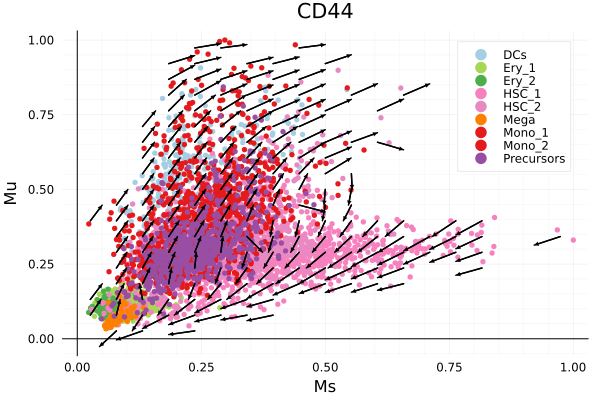

In [24]:
p1 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, xlabel = "Ms", ylabel = "Mu", title = genes[idx], color = palattes[label])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [25]:
idx2 = findfirst(x -> x == "TAOK3", genes)

85

In [26]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([0.026885754395377156 -0.05263157894736842; 0.03307362634738752 -0.05263157894736842; … ; -0.017698025226948442 -0.05263157894736836; -0.009346195090694485 -0.052631578947368474], [0.02631578947368421 0.13157894736842105; 0.02631578947368421 0.18421052631578946; … ; 0.9210526315789473 0.7105263157894737; 0.9736842105263157 0.868421052631579])

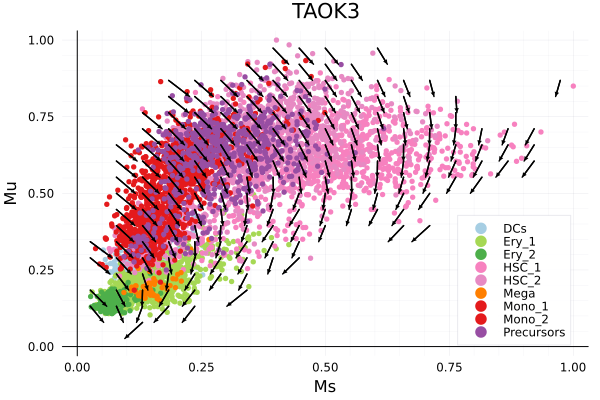

In [27]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, xlabel = "Ms", ylabel = "Mu", title = genes[idx2], color = palattes[label])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [28]:
idx3 = findfirst(x -> x == "CELF2", genes)

50

In [29]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([-0.0016606116216562443 0.05263157894736842; 0.011819666558916454 0.05263157894736842; … ; -0.012985590948379224 -0.052631578947368474; -0.008107509115187402 -0.05263157894736847], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.763157894736842; 0.9736842105263157 0.868421052631579])

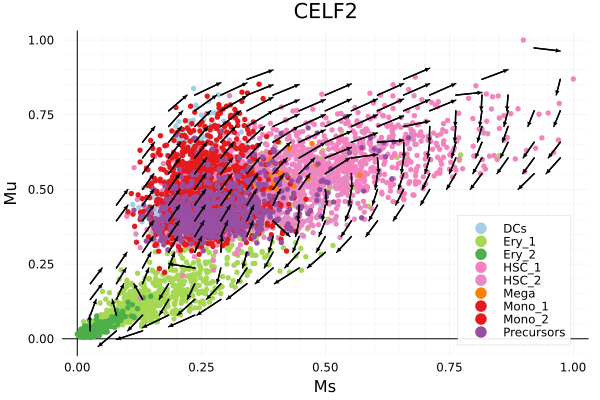

In [30]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, xlabel = "Ms", ylabel = "Mu", title = genes[idx3], color = palattes[label])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

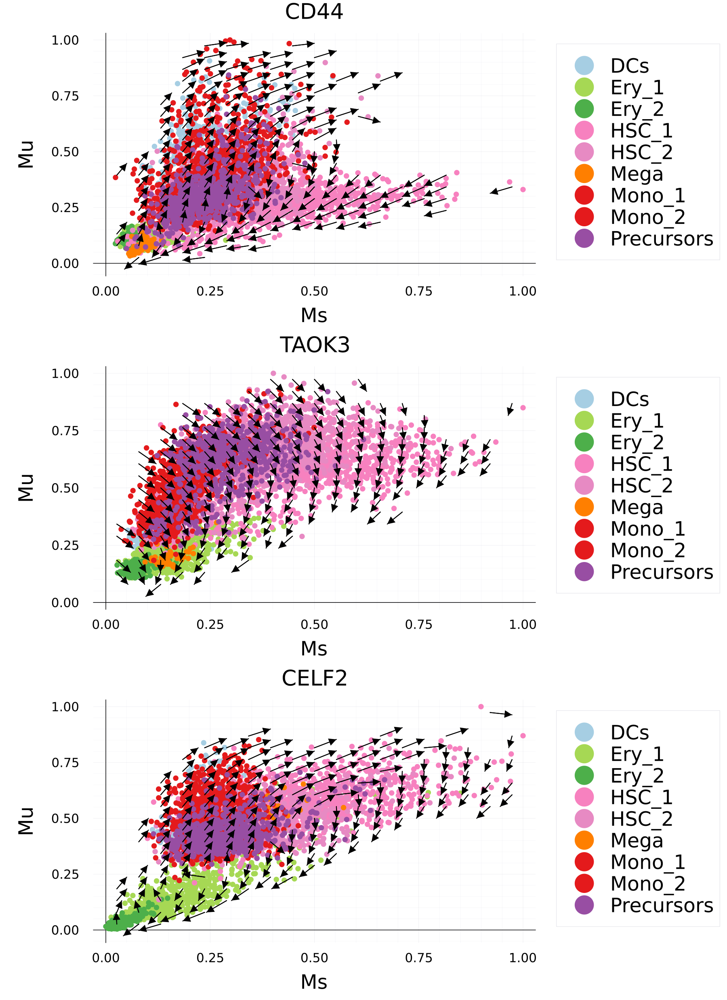

In [31]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1200, 1650), dpi = 150, left_margins = 1.5Plots.cm, legendfontsize = 22, markersize = 5, legend = :outerright, 
    titlefontsize = 24, xtickfontsize = 14, ytickfontsize = 14, xguidefontsize = 22, yguidefontsize = 22)

In [32]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/bone_marrow/figure/JuloVelo_velocity_vector.png"

# Kinetics embedding

In [33]:
kinetics_embedding(adata; basis = "umap", min_dist = 0.5, n_neighbors = 100);

In [34]:
embedding = adata.obsm["kinetics_umap"];

In [35]:
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype))

9-element Vector{String}:
 "DCs"
 "Ery_1"
 "Ery_2"
 "HSC_1"
 "HSC_2"
 "Mega"
 "Mono_1"
 "Mono_2"
 "Precursors"

In [36]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

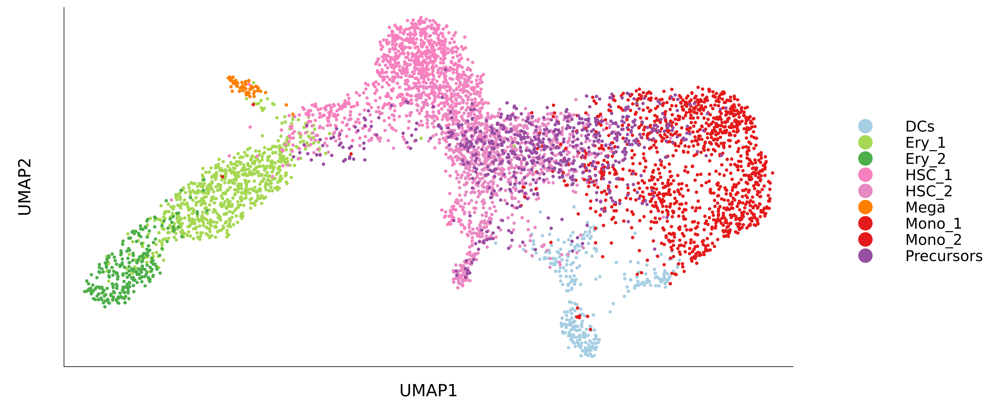

In [37]:
p = scatter(size = (1600, 650), fg_legend = :transparent, left_margins = 2.0Plots.cm, bottom_margins = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, legend=:outerright, legendfontsize = 16, color = palattes[label]
        , xlabel = "UMAP1", ylabel = "UMAP2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [38]:
savefig(p, "figure/bone_marrow_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/bone_marrow/figure/bone_marrow_kinetic_embedding.png"